In [ ]:
'''
1.PyMuPDF is a high-performance Python library for data extraction, analysis, 
conversion & manipulation of PDF (and other) documents. PyMuPDF is hosted on GitHub and registered on PyPI.

2.Pytesseract or Python-tesseract is an OCR tool for python that also serves as a wrapper 
for the Tesseract-OCR Engine.
'''
pip install pdf2image PyMuPDF 
pip install pytesseract
pip install bert_score

# Extracting flowcharts from the patent pdfs

In [ ]:
import fitz  #import PyMuPDF module
import os #module used to interact with local Operating System.

# locating the folder with the patent pdfs
files = os.listdir('/Users/abdulkareemarbaz/Documents/Responsible AI Lab/patent pdfs') 
folder_path = '/Users/abdulkareemarbaz/Documents/Responsible AI Lab/patent pdfs' # recording the path to folder

# for each file in folder get flowcharts from the pdfs
for file_name in files: 
    file_path = os.path.join(folder_path, file_name)
    pdf_document = fitz.open(file_path)
    
    # iterate through each page in pdf file
    for page_number in range(len(pdf_document)): 
        page = pdf_document.load_page(page_number)
        image_list = page.get_images(full=True)

        # iterate through the pages and extract images from them.
        for img_index, img in enumerate(image_list):
            xref = img[0]
            base_image = pdf_document.extract_image(xref) # extracting images 
            image_data = base_image["image"]

            with open(f'/Users/abdulkareemarbaz/Documents/Responsible AI Lab/images1/page_{page_number}_img_{img_index}.jpg', 'wb') as f:
                
                # saving each image in the particular folder
                f.write(image_data) 

pdf_document.close() # Close the PDF file


In [60]:
print(sorted(files))

['.DS_Store', 'file00001.png', 'file00002.png', 'file00003.jpg', 'file00004.jpg', 'file00005.jpg', 'file00006.jpg', 'file00007.jpg', 'file00008.png', 'file00009.jpg', 'file00010.jpg', 'file00011.jpg', 'file00012.jpg', 'file00013.jpg', 'file00014.jpg', 'file00015.jpg', 'file00016.jpg', 'file00017.jpg', 'file00018.jpg', 'file00019.jpg', 'file00020.jpg', 'file00021.jpg', 'file00022.jpg', 'file00023.jpg', 'file00024.jpg', 'file00025.jpg', 'file00026.jpg', 'file00027.jpg', 'file00028.jpg', 'file00029.jpg', 'file00030.jpg', 'file00031.jpg', 'file00032.jpg', 'file00033.jpg', 'file00034.png', 'file00035.png', 'file00036.png', 'file00037.png', 'file00038.png', 'file00039.jpg', 'file00040.jpg', 'file00041.png', 'file00042.png', 'file00043.png', 'file00044.png', 'file00045.png', 'file00046.png', 'file00047.jpg', 'file00048.jpg', 'file00049.jpg', 'file00050.png', 'file00051.png', 'file00052.jpg', 'file00053.jpg', 'file00054.jpg', 'file00055.jpg', 'file00056.jpg', 'file00057.jpg', 'file00058.jpg', 

# Extracting images from the folder

In [18]:
import os
from PIL import Image
import cv2

# extract the images from patent pdfs stored in this folder
files = os.listdir('/Users/abdulkareemarbaz/Documents/Responsible AI Lab/flowchart_images/1') 
folder_path = '/Users/abdulkareemarbaz/Documents/Responsible AI Lab/flowchart_images/1'

#store the images in the list
image_list = []
for file_name in sorted(files):
    file_path = os.path.join(folder_path, file_name)
    if os.path.isfile(file_path) and file_name.lower().endswith(('.png','.jpg')):
        
        #extracting images from the folder using imread from cv2
        image = cv2.imread(file_path)
        
        #dont images which are not None
        if type(image) is not(None):
            image_list.append(image)

# Pre processing obtained images

In [20]:
import cv2
image = cv2.imread("/Users/abdulkareemarbaz/Documents/Responsible AI Lab")

In [19]:
import cv2
import numpy as np
from numpy import asarray
gray_images = []
binary_images = []

# pre processing the images to obtain a better image quality.
def preprocess(image):
    
    #converting image to grayscale image
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    #converting images to binary images i.e white and black 
    _, binary_image = cv2.threshold(gray, 150, 215, cv2.THRESH_BINARY)
    
    #resizing the images to get a bigger image
    image= cv2.resize(binary_image, None, fx=5, fy=5)
    
    #using kernel to go through a number of cells in an image
    kernel = np.ones((2, 2), np.uint8)
    
    #using morphology's dilation to remove noise in image
    image = cv2.morphologyEx(binary_image, cv2.MORPH_CLOSE, kernel)
    return image

#taking processed images in a list
processed_image_list = []

#iterate through
for x in image_list:
    if x is not(None):
        processed_image_list.append(preprocess(x))

In [20]:
import re
pattern = re.compile(r'[0-9a-zA-Z!@#$%^&*()=+{}\[\]:;<>,.?/\\`]')


# Extracting text 

In [4]:
import cv2
import numpy as np
import pytesseract
import matplotlib.pyplot as plt

# Extracting text from the image data
def text_extract(image):
    
    #custom_config = r'--oem 3 --psm 11'
    text_regions = pytesseract.image_to_boxes(image)
    return text_regions
    
def text_remove(image,text_regions):
    img = image.copy()
    text_area = []
    
    # Process each text region
    for x in text_regions:
        if not x.isdigit() and x != ' ':
            if x!='\n':
                text_area.append(x)
    for region in text_regions.splitlines():
        
    # Extract the coordinates from the region string
        x, y, x2, y2 = map(int, region.split()[1:5])
        print(region[0])
        matches = pattern.findall(region[0])
        y = image.shape[0] - y
        y2 = image.shape[0] - y2
        print(x, x2,y , y2)
    # Remove the identified text region
        text_area.append([x,y,x2,y2])
        

        if x!=x2 and y!=y2 and len(matches)>0:
            img[y2:y, x:x2] = cv2.medianBlur(image[y2:y, x:x2],21)

    return img
images1 = []
images_text = []
for x in processed_image_list:
    images1.append(text_remove(x,text_extract(x)))
    images_text.append(text_extract(x))

F
111 139 56 16
I
142 154 57 16
G
159 193 57 16
.
198 206 57 49
2
211 236 57 16
3
771 786 318 290
1
794 806 318 290
3
1324 1339 318 290
3
1345 1360 318 290
3
1858 1873 324 296
5
1879 1895 324 296
3
2298 2313 324 296
6
2317 2335 324 296
3
2622 2637 324 296
7
2642 2660 324 296
2
2924 2942 343 315
0
2945 2963 343 315
~
539 2952 380 322
~
767 2952 425 380
~
767 2470 449 425
~
2636 2953 449 425
S
15 34 422 397
T
37 56 422 397
E
59 76 422 397
E
80 97 422 397
R
102 122 421 397
I
124 131 422 397
N
134 153 422 397
G
158 179 422 397
T
194 214 422 397
O
217 239 422 397
R
244 265 421 397
Q
267 289 423 397
U
294 313 422 397
E
317 334 422 397
T
345 383 422 397
d
378 383 422 397
—
431 463 419 399
—
398 541 419 399
>
499 531 419 399
|
530 541 419 399
C
592 621 432 377
O
617 644 432 378
P
643 670 432 377
R
671 694 432 377
E
696 720 432 378
N
717 742 432 378
T
740 767 432 378
C
1176 1197 426 400
U
1201 1220 426 401
R
1226 1246 425 400
R
1249 1269 425 400
E
1272 1289 426 401
N
1293 1312 426 401
T
1315 13

In [147]:
images_text = []
c = 0
for x in processed_image_list:
    c = c + 1
    print(c)
    config = r'--oem 3 --psm 3'
    #gray = cv2.cvtColor(x, cv2.COLOR_BGR2GRAY)
    text = pytesseract.image_to_string(x,config=config)
    images_text.append(text)

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


# Importing SAM(Segment Anything Model)

In [9]:
import os
HOME = os.getcwd()
print("HOME:", HOME)

HOME: /Users/abdulkareemarbaz


In [10]:
%cd {HOME}

import sys
!{sys.executable} -m pip install 'git+https://github.com/facebookresearch/segment-anything.git'

/Users/abdulkareemarbaz
  Cloning https://github.com/facebookresearch/segment-anything.git to /private/var/folders/h9/nl4pzyrs7776qs7h68x0wh_h0000gn/T/pip-req-build-bd5yyx5h
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /private/var/folders/h9/nl4pzyrs7776qs7h68x0wh_h0000gn/T/pip-req-build-bd5yyx5h
  Resolved https://github.com/facebookresearch/segment-anything.git to commit 6fdee8f2727f4506cfbbe553e23b895e27956588
  Preparing metadata (setup.py) ... done


In [11]:
!pip install -q jupyter_bbox_widget roboflow dataclasses-json supervision


[notice] A new release of pip is available: 23.3.1 -> 23.3.2
[notice] To update, run: python3.11 -m pip install --upgrade pip


In [12]:
%cd {HOME}
!mkdir {HOME}/weights
%cd {HOME}/weights

!wget -q https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

/Users/abdulkareemarbaz
mkdir: /Users/abdulkareemarbaz/weights: File exists
/Users/abdulkareemarbaz/weights


In [13]:
import os

CHECKPOINT_PATH = os.path.join(HOME, "weights", "sam_vit_h_4b8939.pth")
print(CHECKPOINT_PATH, "; exist:", os.path.isfile(CHECKPOINT_PATH))

/Users/abdulkareemarbaz/weights/sam_vit_h_4b8939.pth ; exist: True


In [14]:
%cd {HOME}
!mkdir {HOME}/data
%cd {HOME}/data

!wget -q https://media.roboflow.com/notebooks/examples/dog.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-2.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-3.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-4.jpeg

/Users/abdulkareemarbaz
mkdir: /Users/abdulkareemarbaz/data: File exists
/Users/abdulkareemarbaz/data


In [15]:
import torch

DEVICE = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
MODEL_TYPE = "vit_h"

In [16]:
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor

sam = sam_model_registry[MODEL_TYPE](checkpoint=CHECKPOINT_PATH).to(device=DEVICE)

In [17]:
mask_generator = SamAutomaticMaskGenerator(sam)

# Creating segments using SAM

Either follow this step to obtain segments or follow the one below it to get the segments already obtained , since obtaining segments for all images would take time.

In [ ]:
import cv2
import supervision as sv
import numpy as np

sam_result = []
    
# generate the segments using the sam model and store it's result 
for x in image_list: 
    sam_result.append(mask_generator.generate(x))

In [88]:
import pandas as pd
from numpy import array
# Replace 'your_file.xlsx' with the path to your Excel file
file_path = '/Users/abdulkareemarbaz/Documents/Responsible AI Lab/Book2.xlsx'

# Read the Excel file into a Pandas DataFrame
df = pd.read_excel(file_path)

# Display the DataFrame the data frame consists data for description , text in images , segment , pytesseract text
# Since it would take a lot of time to get the SAM result , you can use the SAM result for the whole dataset which i 
#have obtained in the column 'segment'.

print("Extracted Data:")
print(df)
list_dicts = [] #save the segmented data in a list
for x in df['segment']:
    stri = ""
    dicts = []
    for a in x[1:]:
        if a == '\'':
            stri+='\"'
        elif a == '}':
            stri+=a
            if(stri[0] == ","):
                dicts.append(eval(stri[2:]))
            else:
                dicts.append(eval(stri))
            print(stri)
            stri = ""
        else:
            stri+=a
    list_dicts.append(dicts)


Extracted Data:
                          instruction_based_prompting:  \
0    1.Steering Torque Td: This step represents the...   
1    1.110 Current Command Value Iref: This is the ...   
2    1.START: This is the starting point of the flo...   
3    1.Transfer Characteristic: This step involves ...   
4    1.Start: This state begins the process 2.INPUT...   
..                                                 ...   
545  1.Publication, Patent or Application Sheet: Th...   
546  1.C POWER SUPPLY CONTROL PROCESSING STARTS: In...   
547  1.Information Acquisition Processing starts: T...   
548  1.Publication, Patent, or Application: This st...   
549                                                NaN   

                                           DESCRIPTION  \
0    1.STEERING TORQUE and VEHICLE SPEED are sent i...   
1    1. There are input Signals Steering Torque is ...   
2    \nInput Parameters: The process starts with th...   
3    Transfer Characteristic: The process starts wi... 

ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (7,) + inhomogeneous part.

In [169]:
import math
masks = []
boxes = []

#iterate through all the images data in sam_result
    
    # store the segmentation data onbtained from SAM model and sort it according to the point coordinates
for x in list_dicts:
    masks.append( [
        mask['segmentation']
        for mask
        in sorted(x, key=lambda x: x['point_coords'][0][1] if x['area']>10000 else False
            )
    ])
    
    # store the bounding box data onbtained from SAM model and sort it according to the point coordinates
    boxes.append( [
        mask['bbox']
        for mask
        in sorted(x, key=lambda x: x['point_coords'][0][1] if x['area']>10000 else False
                )
    ])

2977 1566 3
1
2974 1761 3
2
1414 3009 3
3
1367 2564 3
4
1406 3038 3
5
1406 2684 3
6
1422 2721 3
7
1422 2922 3
8
1406 2510 3
9
2560 3300 3
10
2560 3300 3
11
2560 3300 3
12
2560 3300 3
13
2560 3300 3
14
2560 3300 3
15
2560 3300 3
16
2560 3300 3
17
2560 3300 3
18
2560 3300 3
19
2560 3300 3
20
2560 3300 3
21
2560 3300 3
22
2560 3300 3
23
2560 3300 3
24
2560 3300 3
25
2560 3300 3
26
2560 3300 3
27
2560 3300 3
28
2560 3300 3
29
2560 3300 3
30
2560 3300 3
31
2560 3300 3
32
2560 3300 3
33
3300 2560 3
34
3300 2560 3
35
3300 2560 3
36
3300 2560 3
37
3300 2560 3
38
2560 3300 3
39
2560 3300 3
40
3300 2560 3
41
3300 2560 3
42
3300 2560 3
43
3300 2560 3
44
3300 2560 3
45
3300 2560 3
46
2560 3300 3
47
2560 3300 3
48
2560 3300 3
49
3300 2560 3
50
3300 2560 3
51
2560 3300 3
52
2560 3300 3
53
2560 3300 3
54
2560 3300 3
55
2560 3300 3
56
2560 3300 3
57
2560 3300 3
58
2560 3300 3
59
2560 3300 3
60
2560 3300 3
61
2560 3300 3
62
2560 3300 3
63
2560 3300 3
64
2560 3300 3
65
2560 3300 3
66
2560 3300 3
67
2560

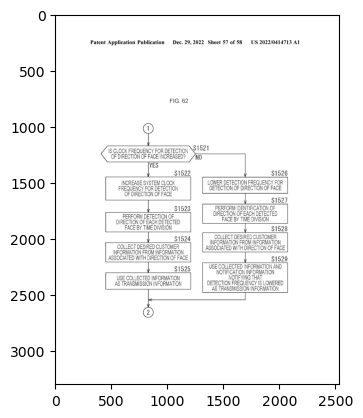

In [170]:
words = []
c = 0
# iterate through each segment and store the text from those images.
for box,image in zip(boxes,image_list):
    c = c + 1
    word = []
    # going through each bounding box
    width,height,color = image.shape
    print(height,width,color)
    for a in box:
        #if x == a[0] and y == a[1]:
        #    continue
        x , y ,w , h = a
        x = int(x)
        y = int(y)
        w = int(w)
        h = int(h)
        #print(x , y , w , h)
        if x>width:
            x = width-1
        if y>width:
            y = width-1
       # matches = pattern.findall(a)
        if x!=w and y!=h :
        
            #print(x , y , w , h)
        
            #taking segment of the image
            if(x+w > height):
                continue
            if(y+h > width):
                continue
        
            image_segment = image[y:y+h, x:x+w]
            #extracting text from the image segment
            boxes_data = pytesseract.image_to_string(image_segment)
            plt.imshow(image_segment)
            word.append(boxes_data)
    words.append(word)
    print(c)

# Using ChatGPT to make sense of the data obtained

In [151]:
pip install openai

Note: you may need to restart the kernel to use updated packages.


# Evaluating ChatGPT Enhanced text

In [118]:
prompts1 = []
for x in words:
    prompts1.append(str(x))

In [120]:
prec = []
rec = []
f1_s = []

In [121]:
from bert_score import score

# Example sentences
for x,y in zip(df['TEXT IN IMAGES'],prompts):
    reference = [x]
    candidate = [y]

# Calculate BERTScore
    P, R, F1 = score(candidate, reference, lang="en")

# Print results
    for ref, can, p, r, f1 in zip(reference, candidate, P, R, F1):
        prec.append(p)
        rec.append(r)
        f1_s.append(f1)

Some weights of RobertaModel were not initialized from the model checkpoint at roberta-large and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of RobertaModel were not initialized from the model checkpoint at roberta-large and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of RobertaModel were not initialized from the model checkpoint at roberta-large and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of RobertaModel were not initialized from the model checkpoint at roberta-large and are newly initialized: ['ro

In [123]:
print(sum(prec)/549)
print(sum(rec)/549)
print(sum(f1_s)/549)


tensor(0.7553)
tensor(0.8373)
tensor(0.7940)


In [124]:
prec_gpt = []
rec_gpt = []
f1_s_gpt = []

In [125]:
prompts2 = []
for x in words:
    prompts2.append("correct the text detected by pytesseract:"+str(x))

In [126]:
import openai
openai.api_key = '30cf41f3e3cd43ccbb56b8eb3f2f89a5' 
openai.api_base = "https://arbaz.openai.azure.com/"  # Replace with your Azure endpoint URL
openai.api_type = 'azure'
openai.api_version = '2023-08-01-preview'
deployment_name = 'arbaz-model'  # Replace with your deployment name

In [127]:
c = 0
answer_gpt_pytesseract = []
for x in prompts:
    c = c+1
    print(c)
    response = openai.ChatCompletion.create(engine=deployment_name, messages=[{"role": "system", "content": x}])
    answer_gpt_pytesseract.append(response['choices'][0]['message']['content'].replace('\n', '').replace(' .', '.').strip())

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


In [128]:
from bert_score import score

# Example sentences
for x,y in zip(df['TEXT IN IMAGES'],answer_gpt_pytesseract):
    reference = [x]
    candidate = [y]

# Calculate BERTScore
    P, R, F1 = score(candidate, reference, lang="en")

# Print results
    for ref, can, p, r, f1 in zip(reference, candidate, P, R, F1):
        prec_gpt.append(p)
        rec_gpt.append(r)
        f1_s_gpt.append(f1)

Some weights of RobertaModel were not initialized from the model checkpoint at roberta-large and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of RobertaModel were not initialized from the model checkpoint at roberta-large and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of RobertaModel were not initialized from the model checkpoint at roberta-large and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of RobertaModel were not initialized from the model checkpoint at roberta-large and are newly initialized: ['ro

In [130]:
print(sum(prec_gpt)/549)
print(sum(rec_gpt)/549)
print(sum(f1_s_gpt)/549)


tensor(0.8029)
tensor(0.8388)
tensor(0.8200)


# Evaluating description of Flowcharts:

In [123]:
prompts = []

for x,y in zip(words,boxes):
    prompts.append("Give a detailed and descriptive interpretation of the flowchart in the form of steps using following details pytesseract text recognition data:"+str(x)+"bounding box info obtained from sam(segment anything model):"+str(y))

In [124]:
import openai
openai.api_key = '30cf41f3e3cd43ccbb56b8eb3f2f89a5' 
openai.api_base = "https://arbaz.openai.azure.com/"  # Replace with your Azure endpoint URL
openai.api_type = 'azure'
openai.api_version = '2023-08-01-preview'
deployment_name = 'arbaz-model'  # Replace with your deployment name

In [199]:
c = 0
answer1 = []
for x in prompts:
    c = c+1
    print(c)
    response = openai.ChatCompletion.create(engine=deployment_name, messages=[{"role": "system", "content": x}],max_tokens=500)
    answer1.append(response['choices'][0]['message']['content'].replace('\n', '').replace(' .', '.').strip())

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


In [201]:
zero_shot_prec = []
zero_shot_rec = []
zero_shot_f1_s = []

In [202]:
from bert_score import score

# Example sentences
for x,y in zip(df['DESCRIPTION'],answer1):
    reference = [x]
    candidate = [y]

# Calculate BERTScore
    P, R, F1 = score(candidate, reference, lang="en")

# Print results
    for ref, can, p, r, f1 in zip(reference, candidate, P, R, F1):
        zero_shot_prec.append(p)
        zero_shot_rec.append(r)
        zero_shot_f1_s.append(f1)

Some weights of RobertaModel were not initialized from the model checkpoint at roberta-large and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of RobertaModel were not initialized from the model checkpoint at roberta-large and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of RobertaModel were not initialized from the model checkpoint at roberta-large and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of RobertaModel were not initialized from the model checkpoint at roberta-large and are newly initialized: ['ro

In [258]:
print(sum(zero_shot_prec)/549)
print(sum(zero_shot_rec)/549)
print(sum(zero_shot_f1_s)/549)


tensor(0.8333)
tensor(0.8314)
tensor(0.8468)


In [171]:
input1 = "Give a detailed and descriptive interpretation of the flowchart in the form of steps using following details pytesseract text recognition data: bounding box info obtained from sam(segment anything model):[[1191, 835, 51, 18], [850, 668, 60, 23], [583, 262, 52, 17], [514, 262, 62, 18], [1345, 835, 43, 18], [1230, 655, 49, 17], [475, 235, 54, 18], [1284, 656, 66, 16], [151, 237, 14, 16], [1286, 540, 14, 65], [84, 10, 264, 175], [84, 10, 264, 121], [85, 11, 262, 510], [84, 10, 263, 260], [0, 0, 1451, 949], [442, 192, 265, 132], [535, 238, 89, 15], [88, 189, 255, 139], [441, 407, 264, 131], [88, 407, 617, 131], [798, 407, 264, 132], [84, 407, 264, 131], [1155, 407, 275, 300], [1155, 407, 275, 132], [797, 611, 617, 132], [797, 612, 264, 132], [1165, 607, 256, 141], [1150, 805, 286, 131]]the text in each of those bounding boxes['', '', '', '', '', '', '', '', '', '', 'Customer places\\n\\nan order\\n', 'Yes\\n', '', 'Customer places\\nan order\\n\\nIs item still in Email customer and\\nstock? cancel order\\n\\nEmail customer with\\nHand off to carrier shipping confirmation\\nand tracking info\\n\\nDoes carrier\\n\\nNotify customer\\n\\ndeliver item?\\n\\nEmail customer with\\n\\nconfirmation of delivery\\nand return instructions\\n', 'Email customer and_\\ncancel order\\n', '', '', 'Print label\\n', 'Pack item Print label\\n', 'Hand off to carrier\\n', 'Pack item\\n', 'Does carrier\\ndeliver item?\\n', '<—No—\\n', '', '', 'Email customer with\\nconfirmation of delivery\\n\\nCoes return ——\\n']"

In [172]:
knowledge1 = '''1.Customer places an order: When a customer initiates an order, this is the starting point of the process. 
2.Is the item still in stock?: A decision box where we check if the item is still in stock if it is pack the item else email the customer and cancel the order
3. Email customer and cancel order: If the item is no longer in stock, this step involves notifying the customer and canceling the order. 
4.Pack item: Once we pack the item , we print the label on the item.
5.Print label: Once we label is printed , we move to the next step handoff to carrier
6.Handoff to carrier: The item is handed over to the carrier for delivery 
7.Email customer with shipping confirmation and tracking info: Assuming the item is in stock, this step involves informing the customer about the shipment with tracking details. 7.Does the carrier deliver the item?: A branching point where the process checks if the carrier delivers the item, if it does, Email customer with confirmation of delivery and return instructions , else notify the customer and cancel the order.
'''

In [173]:
input2 = "Give a detailed and descriptive interpretation of the flowchart in the form of steps using following details pytesseract text recognition data: bounding box info obtained from sam(segment anything model):[[42, 164, 17, 6], [27, 89, 32, 8], [95, 158, 14, 6], [166, 169, 17, 6], [129, 83, 4, 5], [59, 205, 10, 6], [160, 83, 19, 7], [129, 169, 33, 8], [26, 176, 28, 6], [46, 218, 10, 10], [143, 84, 3, 7], [58, 120, 14, 6], [97, 72, 11, 6], [104, 73, 4, 5], [46, 131, 10, 11], [56, 164, 3, 6], [12, 14, 3, 6], [66, 207, 3, 4], [111, 168, 11, 10], [58, 176, 17, 6], [129, 83, 17, 8], [111, 82, 10, 10], [46, 203, 10, 26], [39, 77, 23, 8], [12, 14, 22, 8], [46, 45, 10, 11], [162, 84, 4, 5], [68, 121, 4, 5], [97, 72, 5, 5], [42, 164, 4, 6], [59, 205, 5, 6], [96, 81, 25, 11], [96, 86, 14, 1], [46, 31, 10, 25], [51, 31, 0, 14], [46, 117, 10, 26], [51, 117, 0, 14], [51, 203, 0, 14], [51, 31, 0, 14], [51, 117, 0, 14], [95, 158, 5, 6], [57, 238, 19, 8], [51, 203, 0, 14], [63, 121, 9, 5], [8, 5, 86, 25], [8, 5, 86, 40], [8, 5, 86, 110], [122, 74, 64, 25], [6, 57, 89, 59], [6, 45, 105, 86], [6, 57, 180, 59], [0, 0, 191, 261], [124, 161, 64, 24], [6, 144, 89, 58], [6, 144, 89, 84], [19, 173, 78, 82], [19, 230, 64, 25], [19, 218, 64, 37]]the text in each of those bounding boxes['', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '[Lamp doesnt work\\n', '', '', '', 'Lamp\\nplunged in?\\n', '', 'Replace bulb\\n', '', 'burned out?\\n\\nRepair lamp\\n', '', '']"

In [174]:
knowledge2 = '''1.Lamp Doesn't Work: In this state , the lamp is not working and move on to check if lamp is plugged in
2. Lamp Plugged in?: A decision point. It checks whether the lamp is plugged in. If it is not then plugin lamp , else check if bulb burned out.
3.Bulb burned out :Check if bulb is burned out , if yes replace bulb else repair lamp
'''

In [178]:
prompts = []

for x,y in zip(words,boxes):
    prompts.append("Give a detailed and descriptive interpretation of the flowchart in the form of steps using following details pytesseract text recognition data:"+str(x)+"bounding box info obtained from sam(segment anything model):"+str(y))

In [176]:
import openai
openai.api_key = '30cf41f3e3cd43ccbb56b8eb3f2f89a5' 
openai.api_base = "https://arbaz.openai.azure.com/"  # Replace with your Azure endpoint URL
openai.api_type = 'azure'
openai.api_version = '2023-08-01-preview'
deployment_name = 'arbaz-model'  # Replace with your deployment name

In [204]:
c = 0
answer2 = []
for x in prompts:
    c = c+1
    print(c)
    response = openai.ChatCompletion.create(engine=deployment_name, messages=[{"role": "system", "content": "You describe flowcharts."},{"role": "user", "content":input1},{"role": "assistant", "content":knowledge1},{"role": "user", "content":input2},{"role": "assistant", "content":knowledge2},{"role": "user", "content":x}],max_tokens=1000)
    answer2.append(response['choices'][0]['message']['content'].replace('\n', '').replace(' .', '.').strip())

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


In [57]:
len(answer2)

549

In [205]:
instruction_based_prec = []
instruction_based_rec = []
instruction_based_f1_s = []

In [206]:
from bert_score import score

# Example sentences
for x,y in zip(df['DESCRIPTION'],answer2):
    reference = [x]
    candidate = [y]

# Calculate BERTScore
    P, R, F1 = score(candidate, reference, lang="en")

# Print results
    for ref, can, p, r, f1 in zip(reference, candidate, P, R, F1):
        instruction_based_prec.append(p)
        instruction_based_rec.append(r)
        instruction_based_f1_s.append(f1)

Some weights of RobertaModel were not initialized from the model checkpoint at roberta-large and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of RobertaModel were not initialized from the model checkpoint at roberta-large and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of RobertaModel were not initialized from the model checkpoint at roberta-large and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of RobertaModel were not initialized from the model checkpoint at roberta-large and are newly initialized: ['ro

In [257]:
print(tensor(0.8554))
print(tensor(0.8548))
print(tensor(0.8549))

tensor(0.8654)
tensor(0.8648)
tensor(0.8649)


In [208]:
prompts = []

for x in images_text:
    prompts.append("Give a detailed and descriptive interpretation of the flowchart in the form of steps using following details pytesseract text recognition data:"+str(x))

In [209]:
import openai
openai.api_key = '30cf41f3e3cd43ccbb56b8eb3f2f89a5' 
openai.api_base = "https://arbaz.openai.azure.com/"  # Replace with your Azure endpoint URL
openai.api_type = 'azure'
openai.api_version = '2023-08-01-preview'
deployment_name = 'arbaz-model'  # Replace with your deployment name

In [252]:
c = 0
answer3 = []
for x in prompts:
    c = c+1
    print(c)
    response = openai.ChatCompletion.create(engine=deployment_name, messages=[{"role": "system", "content": x}],max_tokens=500)
    answer3.append(response['choices'][0]['message']['content'].replace('\n', '').replace(' .', '.').strip())

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


In [254]:
zero_shot_prec_ablation = []
zero_shot_rec_ablation = []
zero_shot_f1_s_ablation = []

In [255]:
from bert_score import score

# Example sentences
for x,y in zip(df['DESCRIPTION'],answer3):
    reference = [x]
    candidate = [y]

# Calculate BERTScore
    P, R, F1 = score(candidate, reference, lang="en")

# Print results
    for ref, can, p, r, f1 in zip(reference, candidate, P, R, F1):
        zero_shot_prec_ablation.append(p)
        zero_shot_rec_ablation.append(r)
        zero_shot_f1_s_ablation.append(f1)

Some weights of RobertaModel were not initialized from the model checkpoint at roberta-large and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of RobertaModel were not initialized from the model checkpoint at roberta-large and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of RobertaModel were not initialized from the model checkpoint at roberta-large and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of RobertaModel were not initialized from the model checkpoint at roberta-large and are newly initialized: ['ro

In [259]:
print(sum(zero_shot_prec_ablation)/549)
print(sum(zero_shot_rec_ablation)/549)
print(sum(zero_shot_f1_s_ablation)/549)

tensor(0.8027)
tensor(0.8249)
tensor(0.8184)


In [230]:
input1_ablation = "Give a detailed and descriptive interpretation of the flowchart in the form of steps using following details pytesseract text recognition data: [Lamp doesn't work]\n\nLamp\n\nplugged in? >) Plug in lamp |\n\nBulb\nburned out?\n\n—J)\n\nReplace bulb\n\n[ Repair lamp |\n\n"

In [231]:
knowledge1_ablation = '''1.Customer places an order: When a customer initiates an order, this is the starting point of the process. 
2.Is the item still in stock?: A decision box where we check if the item is still in stock if it is pack the item else email the customer and cancel the order
3. Email customer and cancel order: If the item is no longer in stock, this step involves notifying the customer and canceling the order. 
4.Pack item: Once we pack the item , we print the label on the item.
5.Print label: Once we label is printed , we move to the next step handoff to carrier
6.Handoff to carrier: The item is handed over to the carrier for delivery 
7.Email customer with shipping confirmation and tracking info: Assuming the item is in stock, this step involves informing the customer about the shipment with tracking details. 7.Does the carrier deliver the item?: A branching point where the process checks if the carrier delivers the item, if it does, Email customer with confirmation of delivery and return instructions , else notify the customer and cancel the order.
'''

In [232]:
input2_ablation = "Give a detailed and descriptive interpretation of the flowchart in the form of steps using following details pytesseract text recognition data: Customer places\n\nEmail customer and\ncan\n\ncel order\n\nEmail customer with\nHand off to carrier shipping confirmation\nand tracking info\n\n’ Does carrier\nNotify customer deliver item?\n\nEmail customer with\n\nai\nconfirmation of delivery\nand return instructions\n"

In [233]:
knowledge2_ablation = '''1.Lamp Doesn't Work: In this state , the lamp is not working and move on to check if lamp is plugged in
2. Lamp Plugged in?: A decision point. It checks whether the lamp is plugged in. If it is not then plugin lamp , else check if bulb burned out.
3.Bulb burned out :Check if bulb is burned out , if yes replace bulb else repair lamp
'''

In [220]:
prompts = []

for x in images_text:
    prompts.append("Give a detailed and descriptive interpretation of the flowchart in the form of steps using following details pytesseract text recognition data:"+str(x))

In [221]:
import openai
openai.api_key = '30cf41f3e3cd43ccbb56b8eb3f2f89a5' 
openai.api_base = "https://arbaz.openai.azure.com/"  # Replace with your Azure endpoint URL
openai.api_type = 'azure'
openai.api_version = '2023-08-01-preview'
deployment_name = 'arbaz-model'  # Replace with your deployment name

In [234]:
c = 0
answer4 = []
for x in prompts:
    c = c+1
    print(c)
    response = openai.ChatCompletion.create(engine=deployment_name, messages=[{"role": "system", "content": "You describe flowcharts."},{"role": "user", "content":input1_ablation},{"role": "assistant", "content":knowledge1_ablation},{"role": "user", "content":input2_ablation},{"role": "assistant", "content":knowledge2_ablation},{"role": "user", "content":x}],max_tokens=1000)
    answer4.append(response['choices'][0]['message']['content'].replace('\n', '').replace(' .', '.').strip())

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


In [235]:
instruction_based_prec_ablation = []
instruction_based_rec_ablation = []
instruction_based_f1_s_ablation = []

In [236]:
from bert_score import score

# Example sentences
for x,y in zip(df['DESCRIPTION'],answer4):
    reference = [x]
    candidate = [y]

# Calculate BERTScore
    P, R, F1 = score(candidate, reference, lang="en")

# Print results
    for ref, can, p, r, f1 in zip(reference, candidate, P, R, F1):
        instruction_based_prec_ablation.append(p)
        instruction_based_rec_ablation.append(r)
        instruction_based_f1_s_ablation.append(f1)

Some weights of RobertaModel were not initialized from the model checkpoint at roberta-large and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of RobertaModel were not initialized from the model checkpoint at roberta-large and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of RobertaModel were not initialized from the model checkpoint at roberta-large and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of RobertaModel were not initialized from the model checkpoint at roberta-large and are newly initialized: ['ro

In [261]:
print(sum(instruction_based_prec_ablation)/549)
print(sum(instruction_based_rec_ablation)/549)
print(sum(instruction_based_f1_s_ablation)/549)

tensor(0.8320)
tensor(0.8242)
tensor(0.8278)


In [101]:
pip install Word2Vec

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.3/42.3 kB 3.0 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for Word2Vec: filename=word2vec-0.11.1-py2.py3-none-any.whl size=106277 sha256=83f6bcfa73216b50836e68f1dc9daa7cae334d89c98ff5efc55b76295fd82e38
  Stored in directory: /Users/abdulkareemarbaz/Library/Caches/pip/wheels/d7/3e/81/4f4daaa6d86f5b9301c16cb1051baa2cbf8f0a309063862b2b
Successfully built Word2Vec
Note: you may need to restart the kernel to use updated packages.


In [135]:
from gensim.models import KeyedVectors
import string

# Load pre-trained Word2Vec model (example using Google's Word2Vec model)
model_path = '/Users/abdulkareemarbaz/Documents/Responsible AI Lab/word2vec-google-news-300.model'
word2vec_model = KeyedVectors.load(model_path)

# Tokenize and preprocess sentences
similarity1 = []
# Remove punctuation from tokens
for x,y in zip(df['DESCRIPTION'],df['zero_shot_prompting']):
    translator = str.maketrans("", "", string.punctuation)
    tokens1 = x.lower().translate(translator).split()
    tokens2 = y.lower().translate(translator).split()

    # Check if tokens are present in the model's vocabulary
    tokens1 = [token for token in tokens1 if token in word2vec_model.key_to_index]
    tokens2 = [token for token in tokens2 if token in word2vec_model.key_to_index]

    # Calculate similarity between two sentences
    similarity_score = word2vec_model.n_similarity(tokens1, tokens2)
    print(f"Similarity Score: {similarity_score}")
    similarity1.append(similarity_score)
    

Similarity Score: 0.8607358336448669
Similarity Score: 0.9190354943275452
Similarity Score: 0.8460792899131775
Similarity Score: 0.9258370995521545
Similarity Score: 0.8556182384490967
Similarity Score: 0.8502054810523987
Similarity Score: 0.816926121711731
Similarity Score: 0.8934932947158813
Similarity Score: 0.8132989406585693
Similarity Score: 0.9625166654586792
Similarity Score: 0.9579203724861145
Similarity Score: 0.8678469061851501
Similarity Score: 0.9685640931129456
Similarity Score: 0.9793214797973633
Similarity Score: 0.925397515296936
Similarity Score: 0.9675329923629761
Similarity Score: 0.8860756158828735
Similarity Score: 0.9694943428039551
Similarity Score: 0.9488412737846375
Similarity Score: 0.9342414140701294
Similarity Score: 0.9280206561088562
Similarity Score: 0.9888993501663208
Similarity Score: 0.9927009344100952
Similarity Score: 0.957586407661438
Similarity Score: 0.9081156849861145
Similarity Score: 0.8654394149780273
Similarity Score: 0.9390947818756104
Simi

AttributeError: 'float' object has no attribute 'lower'

In [136]:
sum(similarity1)/549

0.9003089912276451

In [ ]:
from gensim.models import KeyedVectors
import string

# Load pre-trained Word2Vec model (example using Google's Word2Vec model)
model_path = '/Users/abdulkareemarbaz/Documents/Responsible AI Lab/word2vec-google-news-300.model'
word2vec_model = KeyedVectors.load(model_path)

# Tokenize and preprocess sentences
sentence1 = "This is the first sentence."
sentence2 = "My name is Arbaz"
similarity2 = []
# Remove punctuation from tokens
for x,y in zip(df['DESCRIPTION'],df['instruction_based_prompting:']):
    translator = str.maketrans("", "", string.punctuation)
    tokens1 = x.lower().translate(translator).split()
    tokens2 = y.lower().translate(translator).split()

    # Check if tokens are present in the model's vocabulary
    tokens1 = [token for token in tokens1 if token in word2vec_model.key_to_index]
    tokens2 = [token for token in tokens2 if token in word2vec_model.key_to_index]

    # Calculate similarity between two sentences
    similarity_score = word2vec_model.n_similarity(tokens1, tokens2)
    print(f"Similarity Score: {similarity_score}")
    similarity2.append(similarity_score)
    

In [138]:
sum(similarity2)/549

0.9198346815474047

In [139]:
from gensim.models import KeyedVectors
import string

# Load pre-trained Word2Vec model (example using Google's Word2Vec model)
model_path = '/Users/abdulkareemarbaz/Documents/Responsible AI Lab/word2vec-google-news-300.model'
word2vec_model = KeyedVectors.load(model_path)

# Tokenize and preprocess sentences
sentence1 = "This is the first sentence."
sentence2 = "My name is Arbaz"
similarity3 = []
# Remove punctuation from tokens
for x,y in zip(df['DESCRIPTION'],df['zero_shot_prompting_ablation']):
    translator = str.maketrans("", "", string.punctuation)
    tokens1 = x.lower().translate(translator).split()
    tokens2 = y.lower().translate(translator).split()

    # Check if tokens are present in the model's vocabulary
    tokens1 = [token for token in tokens1 if token in word2vec_model.key_to_index]
    tokens2 = [token for token in tokens2 if token in word2vec_model.key_to_index]

    # Calculate similarity between two sentences
    similarity_score = word2vec_model.n_similarity(tokens1, tokens2)
    print(f"Similarity Score: {similarity_score}")
    similarity3.append(similarity_score)
    

Similarity Score: 0.8893664479255676
Similarity Score: 0.8853692412376404
Similarity Score: 0.8709619045257568
Similarity Score: 0.8975940942764282
Similarity Score: 0.8887750506401062
Similarity Score: 0.9089792966842651
Similarity Score: 0.9231303930282593
Similarity Score: 0.8594248294830322
Similarity Score: 0.8629471659660339
Similarity Score: 0.9651911854743958
Similarity Score: 0.8895779252052307
Similarity Score: 0.8753499984741211
Similarity Score: 0.9757264256477356
Similarity Score: 0.9822992086410522
Similarity Score: 0.9367583990097046
Similarity Score: 0.9667572975158691
Similarity Score: 0.8372481465339661
Similarity Score: 0.9622073769569397
Similarity Score: 0.9506890773773193
Similarity Score: 0.9302793741226196
Similarity Score: 0.9746691584587097
Similarity Score: 0.9582523703575134
Similarity Score: 0.9838161468505859
Similarity Score: 0.9374070167541504
Similarity Score: 0.930010199546814
Similarity Score: 0.9093291163444519
Similarity Score: 0.9133932590484619
Si

AttributeError: 'float' object has no attribute 'lower'

In [140]:
sum(similarity3)/549

0.8993593092824592

In [141]:
from gensim.models import KeyedVectors
import string

# Load pre-trained Word2Vec model (example using Google's Word2Vec model)
model_path = '/Users/abdulkareemarbaz/Documents/Responsible AI Lab/word2vec-google-news-300.model'
word2vec_model = KeyedVectors.load(model_path)

# Tokenize and preprocess sentences
sentence1 = "This is the first sentence."
sentence2 = "My name is Arbaz"
similarity4 = []
# Remove punctuation from tokens
for x,y in zip(df['DESCRIPTION'],df['instruction_based_prompting_ablation']):
    translator = str.maketrans("", "", string.punctuation)
    tokens1 = x.lower().translate(translator).split()
    tokens2 = y.lower().translate(translator).split()

    # Check if tokens are present in the model's vocabulary
    tokens1 = [token for token in tokens1 if token in word2vec_model.key_to_index]
    tokens2 = [token for token in tokens2 if token in word2vec_model.key_to_index]

    # Calculate similarity between two sentences
    similarity_score = word2vec_model.n_similarity(tokens1, tokens2)
    print(f"Similarity Score: {similarity_score}")
    similarity4.append(similarity_score)
    

Similarity Score: 0.8805301189422607
Similarity Score: 0.9268774390220642
Similarity Score: 0.907371997833252
Similarity Score: 0.8803730607032776
Similarity Score: 0.9021670818328857
Similarity Score: 0.8940312266349792
Similarity Score: 0.9176274538040161
Similarity Score: 0.9234619140625
Similarity Score: 0.9070240259170532
Similarity Score: 0.958437979221344
Similarity Score: 0.9170698523521423
Similarity Score: 0.8238825798034668
Similarity Score: 0.9575021862983704
Similarity Score: 0.9624156355857849
Similarity Score: 0.9541606307029724
Similarity Score: 0.9761404395103455
Similarity Score: 0.7874631285667419
Similarity Score: 0.9767253398895264
Similarity Score: 0.9620115160942078
Similarity Score: 0.9251560568809509
Similarity Score: 0.9762142300605774
Similarity Score: 0.9797093272209167
Similarity Score: 0.9797525405883789
Similarity Score: 0.9440634846687317
Similarity Score: 0.9418023228645325
Similarity Score: 0.9208288192749023
Similarity Score: 0.9473394155502319
Simila

AttributeError: 'float' object has no attribute 'lower'

In [142]:
sum(similarity4)/549

0.8947159957907456

In [145]:
pip install sentence-transformers

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


  Obtaining dependency information for sentence-transformers from https://files.pythonhosted.org/packages/36/ab/0c48ed3357b80218d20129abad06e6cfff4dc89e80afb7668186daff84e1/sentence_transformers-2.3.0-py3-none-any.whl.metadata
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 12.3 MB/s eta 0:00:00 0:00:01
  Obtaining dependency information for numpy from https://files.pythonhosted.org/packages/7c/f1/77df3d637d8acdb3ea118bc8646c22eaf7c2145416313d038a8efc77eeea/numpy-1.26.3-cp39-cp39-macosx_10_9_x86_64.whl.metadata
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.2/61.2 kB 9.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.8/132.8 kB 19.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.6/20.6 MB 20.9 MB/s eta 0:00:0000:0100:01
  Attempting uninstall: numpy
    Found existing installation: numpy 1.21.5
    Uninstalling numpy-1.21.5:
      Successfully uninstalled numpy-1.21.5
ERROR: pip's dependency resolver does not currently take into account all

In [148]:
from sentence_transformers import SentenceTransformer, util

# Load a pre-trained SBERT model
sbert_model = SentenceTransformer('paraphrase-MiniLM-L6-v2')

# Define your sentences
sentence1 = "This is the first sentence."
sentence2 = "This is the first sentence."

# Encode the sentences using SBERT
s1 = []
for x,y in zip(df['DESCRIPTION'],df['zero_shot_prompting']):
    embedding1 = sbert_model.encode([x], convert_to_tensor=True)
    embedding2 = sbert_model.encode([y], convert_to_tensor=True)

    # Calculate cosine similarity between the embeddings
    cosine_similarity = util.pytorch_cos_sim(embedding1, embedding2)[0][0].item()
    print(f"Cosine Similarity: {cosine_similarity}")
    s1.append(cosine_similarity)


Cosine Similarity: 0.5557310581207275
Cosine Similarity: 0.6735939383506775
Cosine Similarity: 0.67267906665802
Cosine Similarity: 0.856955885887146
Cosine Similarity: 0.6937642097473145
Cosine Similarity: 0.8296570181846619
Cosine Similarity: 0.6062684059143066
Cosine Similarity: 0.7621707320213318
Cosine Similarity: 0.804958701133728
Cosine Similarity: 0.8417708873748779
Cosine Similarity: 0.6893072724342346
Cosine Similarity: 0.35190823674201965
Cosine Similarity: 0.822831392288208
Cosine Similarity: 0.7088193893432617
Cosine Similarity: 0.728466272354126
Cosine Similarity: 0.859919011592865
Cosine Similarity: 0.7453705668449402
Cosine Similarity: 0.7759983539581299
Cosine Similarity: 0.7732429504394531
Cosine Similarity: 0.710892915725708
Cosine Similarity: 0.8760402798652649
Cosine Similarity: 0.9300798177719116
Cosine Similarity: 0.9152947664260864
Cosine Similarity: 0.5830461978912354
Cosine Similarity: 0.533086895942688
Cosine Similarity: 0.6524287462234497
Cosine Similarity: 0

TypeError: 'float' object is not subscriptable

In [150]:
sum(s1)/549

0.6505623390263655

In [151]:
from sentence_transformers import SentenceTransformer, util

# Load a pre-trained SBERT model
sbert_model = SentenceTransformer('paraphrase-MiniLM-L6-v2')

# Define your sentences
sentence1 = "This is the first sentence."
sentence2 = "This is the first sentence."

# Encode the sentences using SBERT
s2 = []
for x,y in zip(df['DESCRIPTION'],df['instruction_based_prompting:']):
    embedding1 = sbert_model.encode([x], convert_to_tensor=True)
    embedding2 = sbert_model.encode([y], convert_to_tensor=True)

    # Calculate cosine similarity between the embeddings
    cosine_similarity = util.pytorch_cos_sim(embedding1, embedding2)[0][0].item()
    print(f"Cosine Similarity: {cosine_similarity}")
    s2.append(cosine_similarity)


Cosine Similarity: 0.68123459815979
Cosine Similarity: 0.7695126533508301
Cosine Similarity: 0.8527098894119263
Cosine Similarity: 0.8501892685890198
Cosine Similarity: 0.7404334545135498
Cosine Similarity: 0.8883962631225586
Cosine Similarity: 0.8922975063323975
Cosine Similarity: 0.8194211721420288
Cosine Similarity: 0.8363456726074219
Cosine Similarity: 0.8624227046966553
Cosine Similarity: 0.9879604578018188
Cosine Similarity: 0.8273968696594238
Cosine Similarity: 0.857405424118042
Cosine Similarity: 0.9513652324676514
Cosine Similarity: 0.972190797328949
Cosine Similarity: 0.8790751099586487
Cosine Similarity: 0.9149905443191528
Cosine Similarity: 0.9799290299415588
Cosine Similarity: 0.96668541431427
Cosine Similarity: 0.3714892268180847
Cosine Similarity: 0.9035782814025879
Cosine Similarity: 0.875044584274292
Cosine Similarity: 0.8798291087150574
Cosine Similarity: 0.9269644021987915
Cosine Similarity: 0.9387773275375366
Cosine Similarity: 0.6952660083770752
Cosine Similarity: 

TypeError: 'float' object is not subscriptable

In [152]:
sum(s2)/549

0.7238008913894495

In [153]:
from sentence_transformers import SentenceTransformer, util

# Load a pre-trained SBERT model
sbert_model = SentenceTransformer('paraphrase-MiniLM-L6-v2')

# Define your sentences
sentence1 = "This is the first sentence."
sentence2 = "This is the first sentence."

# Encode the sentences using SBERT
s3 = []
for x,y in zip(df['DESCRIPTION'],df['zero_shot_prompting_ablation']):
    embedding1 = sbert_model.encode([x], convert_to_tensor=True)
    embedding2 = sbert_model.encode([y], convert_to_tensor=True)

    # Calculate cosine similarity between the embeddings
    cosine_similarity = util.pytorch_cos_sim(embedding1, embedding2)[0][0].item()
    print(f"Cosine Similarity: {cosine_similarity}")
    s3.append(cosine_similarity)


Cosine Similarity: 0.6324104070663452
Cosine Similarity: 0.7947208881378174
Cosine Similarity: 0.653414249420166
Cosine Similarity: 0.756910502910614
Cosine Similarity: 0.7979373335838318
Cosine Similarity: 0.8270963430404663
Cosine Similarity: 0.7901043891906738
Cosine Similarity: 0.5621044635772705
Cosine Similarity: 0.6176061034202576
Cosine Similarity: 0.7277361750602722
Cosine Similarity: 0.38682422041893005
Cosine Similarity: 0.3418891429901123
Cosine Similarity: 0.8098456859588623
Cosine Similarity: 0.8810591697692871
Cosine Similarity: 0.6044603586196899
Cosine Similarity: 0.8819397687911987
Cosine Similarity: 0.7142118811607361
Cosine Similarity: 0.7366992831230164
Cosine Similarity: 0.8073481321334839
Cosine Similarity: 0.7283061146736145
Cosine Similarity: 0.7650256156921387
Cosine Similarity: 0.8421679735183716
Cosine Similarity: 0.7311171293258667
Cosine Similarity: 0.544531524181366
Cosine Similarity: 0.40575313568115234
Cosine Similarity: 0.5867406725883484
Cosine Simila

TypeError: 'float' object is not subscriptable

In [154]:
sum(s3)/549

0.643847378065813

In [155]:
from sentence_transformers import SentenceTransformer, util

# Load a pre-trained SBERT model
sbert_model = SentenceTransformer('paraphrase-MiniLM-L6-v2')

# Define your sentences
sentence1 = "This is the first sentence."
sentence2 = "This is the first sentence."

# Encode the sentences using SBERT
s4 = []
for x,y in zip(df['DESCRIPTION'],df['instruction_based_prompting_ablation']):
    embedding1 = sbert_model.encode([x], convert_to_tensor=True)
    embedding2 = sbert_model.encode([y], convert_to_tensor=True)

    # Calculate cosine similarity between the embeddings
    cosine_similarity = util.pytorch_cos_sim(embedding1, embedding2)[0][0].item()
    print(f"Cosine Similarity: {cosine_similarity}")
    s4.append(cosine_similarity)


Cosine Similarity: 0.647436261177063
Cosine Similarity: 0.7220892906188965
Cosine Similarity: 0.7782254219055176
Cosine Similarity: 0.8449209928512573
Cosine Similarity: 0.8491366505622864
Cosine Similarity: 0.8262947201728821
Cosine Similarity: 0.8085815906524658
Cosine Similarity: 0.8672006726264954
Cosine Similarity: 0.8387551307678223
Cosine Similarity: 0.8636739253997803
Cosine Similarity: 0.4213748574256897
Cosine Similarity: 0.3750033378601074
Cosine Similarity: 0.7814988493919373
Cosine Similarity: 0.8576449155807495
Cosine Similarity: 0.703852653503418
Cosine Similarity: 0.865186870098114
Cosine Similarity: 0.5366039276123047
Cosine Similarity: 0.7868560552597046
Cosine Similarity: 0.6439184546470642
Cosine Similarity: 0.18689706921577454
Cosine Similarity: 0.9079192876815796
Cosine Similarity: 0.8836888670921326
Cosine Similarity: 0.8833820223808289
Cosine Similarity: 0.7583744525909424
Cosine Similarity: 0.4114185869693756
Cosine Similarity: 0.5688549280166626
Cosine Similar

TypeError: 'float' object is not subscriptable

In [156]:
sum(s4)/549

0.6536245802909353

In [3]:
pip install -U sentence-transformers

  Obtaining dependency information for sentence-transformers from https://files.pythonhosted.org/packages/06/97/57afa3d05801b6b9305f96a7ce5995e12c1d2ba25ce66747de107816b0b5/sentence_transformers-2.3.1-py3-none-any.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.8/132.8 kB 2.5 MB/s eta 0:00:00a 0:00:01
  Attempting uninstall: sentence-transformers
    Found existing installation: sentence-transformers 2.3.0
    Uninstalling sentence-transformers-2.3.0:
      Successfully uninstalled sentence-transformers-2.3.0
Note: you may need to restart the kernel to use updated packages.


In [19]:
from sentence_transformers import SentenceTransformer, util

model = SentenceTransformer('sentence-transformers/all-MiniLM-L6-v2')
c = 0
instruction_based = []
for x,y in zip(df['DESCRIPTION'] ,df['instruction_based_prompting:']):
    sentences = [x,y]

#Compute embedding for both lists
    embedding_1= model.encode(sentences[0], convert_to_tensor=True)
    embedding_2 = model.encode(sentences[1], convert_to_tensor=True)

    instruction_based.append(util.pytorch_cos_sim(embedding_1, embedding_2))
    c = c+1
    print(c)
## tensor([[0.6003]])


1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


TypeError: 'float' object is not subscriptable

In [20]:
sum(instruction_based)/549

tensor([[0.7625]], device='mps:0')

In [23]:
from sentence_transformers import SentenceTransformer, util

zero_based_a = []
model = SentenceTransformer('sentence-transformers/all-MiniLM-L6-v2')
c = 0 
for x,y in zip(df['DESCRIPTION'] ,df['zero_shot_prompting_ablation'] ):
    sentences = [x,y]

#Compute embedding for both lists
    embedding_1= model.encode(sentences[0], convert_to_tensor=True)
    embedding_2 = model.encode(sentences[1], convert_to_tensor=True)

    zero_based_a.append(util.pytorch_cos_sim(embedding_1, embedding_2))
    c = c+1
    print(c)
## tensor([[0.6003]])


1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


TypeError: 'float' object is not subscriptable

In [24]:
sum(zero_based_a)/549

tensor([[0.6996]], device='mps:0')

In [25]:
from sentence_transformers import SentenceTransformer, util

instruction_based_a = []
model = SentenceTransformer('sentence-transformers/all-MiniLM-L6-v2')
c = 0
for x,y in zip(df['DESCRIPTION'] ,df['instruction_based_prompting_ablation']):
    sentences = [x,y]
#Compute embedding for both lists
    embedding_1= model.encode(sentences[0], convert_to_tensor=True)
    embedding_2 = model.encode(sentences[1], convert_to_tensor=True)

    instruction_based_a.append(util.pytorch_cos_sim(embedding_1, embedding_2))
    c = c+1
    print(c)
    
## tensor([[0.6003]])


1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


TypeError: 'float' object is not subscriptable

In [26]:
sum(instruction_based_a)/549

tensor([[0.7031]], device='mps:0')

In [64]:
from gensim.models import KeyedVectors
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity


def get_sentence_embedding(sentence, word_vectors):
    words = sentence.split()
    embeddings = [word_vectors[word] for word in words if word in word_vectors]
    if embeddings:
        return np.mean(embeddings, axis=0)
    else:
        return np.zeros(word_vectors.vector_size)
# Example sentences
model_path = "/Users/abdulkareemarbaz/Documents/Responsible AI Lab/word2vec-google-news-300.model"
word_vectors = KeyedVectors.load(model_path)
l = []
c = 0
for x,y in zip(df['DESCRIPTION'] ,df['instruction_based_prompting_ablation']):
    sentence1 = x
    sentence2 = y

# Generate word embeddings for each word in the sentences

# Get sentence embeddings
    embedding1 = get_sentence_embedding(sentence1, word_vectors)
    embedding2 = get_sentence_embedding(sentence2, word_vectors)

# Calculate cosine similarity between sentence embeddings
    embedding_similarity_score = cosine_similarity([embedding1], [embedding2])[0][0]

# Calculate structural similarity score (e.g., cosine similarity between sentence vectors)
    structural_similarity_score = cosine_similarity([embedding1], [embedding2])[0][0]

# Combine the scores (you can adjust the weights based on your requirements)
    weight_embeddings = 0.5
    weight_structural_similarity = 0.5

    combined_score = (weight_embeddings * embedding_similarity_score) + (weight_structural_similarity * structural_similarity_score)
    l.append(combined_score)
    c=c+1
    print(c, combined_score)

1 0.6392685174942017
2 0.8779967427253723
3 0.8563300967216492
4 0.8686292767524719
5 0.8676460385322571
6 0.8609073758125305
7 0.8913562297821045
8 0.91038578748703
9 0.8910018801689148
10 0.9411157369613647
11 0.8932859897613525
12 0.814372181892395
13 0.9558400511741638
14 0.9454774856567383
15 0.9179147481918335
16 0.9415191411972046
17 0.7496747970581055
18 0.9748638868331909
19 0.9232791662216187
20 0.8856307864189148
21 0.8985129594802856
22 0.9122852683067322
23 0.933894693851471
24 0.9446524977684021
25 0.9170622229576111
26 0.8521934747695923
27 0.8954148292541504
28 0.9276524186134338
29 0.9424515962600708
30 0.9103062748908997
31 0.8768870830535889
32 0.8969011902809143
33 0.8679710626602173
34 0.6480478048324585
35 0.904177188873291
36 0.8924753069877625
37 0.9033860564231873
38 0.9283803105354309
39 0.9194113612174988
40 0.781394898891449
41 0.7692788243293762
42 0.8068300485610962
43 0.9290441274642944
44 0.9316784739494324
45 0.932661771774292
46 0.500128984451294
47 0.

AttributeError: 'float' object has no attribute 'split'

In [65]:
sum(l)/549

0.823183964144011

In [48]:
from gensim.models import KeyedVectors
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity


def get_sentence_embedding(sentence, word_vectors):
    words = sentence.split()
    embeddings = [word_vectors[word] for word in words if word in word_vectors]
    if embeddings:
        return np.mean(embeddings, axis=0)
    else:
        return np.zeros(word_vectors.vector_size)
# Example sentences
model_path = "/Users/abdulkareemarbaz/Documents/Responsible AI Lab/word2vec-google-news-300.model"
word_vectors = KeyedVectors.load(model_path)
l = []
c = 0
for x,y in zip(df['DESCRIPTION'] ,df['zero_shot_prompting_ablation'] ):
    sentence1 = x
    sentence2 = y

# Generate word embeddings for each word in the sentences

# Get sentence embeddings
    embedding1 = get_sentence_embedding(sentence1, word_vectors)
    embedding2 = get_sentence_embedding(sentence2, word_vectors)

# Calculate cosine similarity between sentence embeddings
    embedding_similarity_score = cosine_similarity([embedding1], [embedding2])[0][0]

# Calculate structural similarity score (e.g., cosine similarity between sentence vectors)
    structural_similarity_score = cosine_similarity([embedding1], [embedding2])[0][0]

# Combine the scores (you can adjust the weights based on your requirements)
    weight_embeddings = 0.6
    weight_structural_similarity = 0.4

    combined_score = (weight_embeddings * embedding_similarity_score) + (weight_structural_similarity * structural_similarity_score)
    l.append(combined_score)
    c=c+1
    print(c, combined_score)

1 0.5932352542877197
2 0.7983530163764954
3 0.859573245048523
4 0.8810921311378479
5 0.8612352609634399
6 0.8731638789176941
7 0.8980877995491028
8 0.8218339085578918
9 0.8269844651222229
10 0.9331209063529968
11 0.8695666790008545
12 0.862205982208252
13 0.9604565501213074
14 0.9744377732276917
15 0.8802818655967712
16 0.9725243449211121
17 0.7744772434234619
18 0.9642557501792908
19 0.9409307837486267
20 0.91428542137146
21 0.9307597875595093
22 0.8918337821960449
23 0.9537989497184753
24 0.9220391511917114
25 0.8938538432121277
26 0.8783965706825256
27 0.8572906851768494
28 0.9158268570899963
29 0.8738172054290771
30 0.8863076567649841
31 0.8675917387008667
32 0.8825496435165405
33 0.7677080631256104
34 0.8800306916236877
35 0.9327411651611328
36 0.8633931279182434
37 0.8825185894966125
38 0.8953194618225098
39 0.9399000406265259
40 0.8644295334815979
41 0.9310188293457031
42 0.8186480402946472
43 0.917337954044342
44 0.9045208692550659
45 0.9072152376174927
46 0.8522158861160278
47

AttributeError: 'float' object has no attribute 'split'

In [49]:
sum(l)/549

0.8162240936185059

In [62]:
from gensim.models import KeyedVectors
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity


def get_sentence_embedding(sentence, word_vectors):
    words = sentence.split()
    embeddings = [word_vectors[word] for word in words if word in word_vectors]
    if embeddings:
        return np.mean(embeddings, axis=0)
    else:
        return np.zeros(word_vectors.vector_size)
# Example sentences
model_path = "/Users/abdulkareemarbaz/Documents/Responsible AI Lab/word2vec-google-news-300.model"
word_vectors = KeyedVectors.load(model_path)
l = []
c = 0
for x,y in zip(df['DESCRIPTION'] ,df['instruction_based_prompting:']):
    sentence1 = x
    sentence2 = y

# Generate word embeddings for each word in the sentences

# Get sentence embeddings
    embedding1 = get_sentence_embedding(sentence1, word_vectors)
    embedding2 = get_sentence_embedding(sentence2, word_vectors)

# Calculate cosine similarity between sentence embeddings
    embedding_similarity_score = cosine_similarity([embedding1], [embedding2])[0][0]

# Calculate structural similarity score (e.g., cosine similarity between sentence vectors)
    structural_similarity_score = cosine_similarity([embedding1], [embedding2])[0][0]

# Combine the scores (you can adjust the weights based on your requirements)
    weight_embeddings = 0.95
    weight_structural_similarity = 0.05

    combined_score = (weight_embeddings * embedding_similarity_score) + (weight_structural_similarity * structural_similarity_score)
    l.append(combined_score)
    c=c+1
    print(c, combined_score)

1 0.6396355032920837
2 0.7945920825004578
3 0.8654600977897644
4 0.8891602754592894
5 0.8819394707679747
6 0.8878731727600098
7 0.910361349582672
8 0.8898022770881653
9 0.8506102561950682
10 0.9650793075561522
11 0.9924671649932861
12 0.8682113885879517
13 0.9689869284629822
14 0.990489363670349
15 0.9836090207099915
16 0.9508280754089355
17 0.9506557583808898
18 0.9816199541091919
19 0.9592862725257874
20 0.7162761092185973
21 0.9386278986930847
22 0.8804933428764342
23 0.9563230872154235
24 0.9828578829765319
25 0.9582170248031615
26 0.8814758062362671
27 0.8883006572723388
28 0.924195408821106
29 0.920182466506958
30 0.9319745302200317
31 0.8841637969017028
32 0.8495413064956665
33 0.8767789602279663
34 0.8422669172286986
35 0.9655987024307251
36 0.7509384751319884
37 0.8946640491485595
38 0.8868313431739807
39 0.9281965494155883
40 0.785193383693695
41 0.9418565630912781
42 0.8996189832687377
43 0.940739333629608
44 0.9445305466651917
45 0.9489534497261046
46 0.9093409180641173
47 

AttributeError: 'float' object has no attribute 'split'

In [63]:
sum(l)/549

0.8443754761325423

In [52]:
from gensim.models import KeyedVectors
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity


def get_sentence_embedding(sentence, word_vectors):
    words = sentence.split()
    embeddings = [word_vectors[word] for word in words if word in word_vectors]
    if embeddings:
        return np.mean(embeddings, axis=0)
    else:
        return np.zeros(word_vectors.vector_size)
# Example sentences
model_path = "/Users/abdulkareemarbaz/Documents/Responsible AI Lab/word2vec-google-news-300.model"
word_vectors = KeyedVectors.load(model_path)
l = []
c = 0
for x,y in zip(df['DESCRIPTION'] ,df['instruction_based_prompting:']):
    sentence1 = x
    sentence2 = y

# Generate word embeddings for each word in the sentences

# Get sentence embeddings
    embedding1 = get_sentence_embedding(sentence1, word_vectors)
    embedding2 = get_sentence_embedding(sentence2, word_vectors)

# Calculate cosine similarity between sentence embeddings
    embedding_similarity_score = cosine_similarity([embedding1], [embedding2])[0][0]

# Calculate structural similarity score (e.g., cosine similarity between sentence vectors)
    structural_similarity_score = cosine_similarity([embedding1], [embedding2])[0][0]

# Combine the scores (you can adjust the weights based on your requirements)
    weight_embeddings = 0.6
    weight_structural_similarity = 0.4

    combined_score = (weight_embeddings * embedding_similarity_score) + (weight_structural_similarity * structural_similarity_score)
    l.append(combined_score)
    c=c+1
    print(c, combined_score)

1 0.5787614583969116
2 0.8057131767272949
3 0.7869263291358948
4 0.8875433802604675
5 0.8396587371826172
6 0.8705348968505859
7 0.6632358431816101
8 0.8393402695655823
9 0.7175841927528381
10 0.9478681683540344
11 0.906847357749939
12 0.8006961941719055
13 0.9599641561508179
14 0.9718849658966064
15 0.8540931344032288
16 0.9651640057563782
17 0.7848237156867981
18 0.9677453637123108
19 0.925397515296936
20 0.8807077407836914
21 0.9146031737327576
22 0.9620744585990906
23 0.9654591083526611
24 0.9506340026855469
25 0.8811750411987305
26 0.7809796333312988
27 0.9115888476371765
28 0.9560007452964783
29 0.9351771473884583
30 0.9227141737937927
31 0.9164640307426453
32 0.8784736394882202
33 0.8526475429534912
34 0.800507664680481
35 0.9377626180648804
36 0.8733869791030884
37 0.9053255319595337
38 0.8910551071166992
39 0.9173482060432434
40 0.8577069044113159
41 0.8574297428131104
42 0.7645800113677979
43 0.9465141296386719
44 0.9749158620834351
45 0.918574869632721
46 0.9271750450134277
4

AttributeError: 'float' object has no attribute 'split'

In [53]:
sum(l)/549

0.8178382080543671

In [115]:
from sentence_transformers import SentenceTransformer, util
import numpy as np
import re  # Import the regex module for sentence splitting

# Load Sentence Transformers model
model = SentenceTransformer('sentence-transformers/all-MiniLM-L6-v2')

# Function to tokenize a sentence
def tokenize(sentence):
    return sentence.split()

# Function to generate embeddings for a sentence
def generate_sentence_embedding1(sentence, word_vectors):
    words = sentence.split()
    embeddings = [word_vectors[word] for word in words if word in word_vectors]
    if embeddings:
        return np.mean(embeddings, axis=0)
    else:
        return np.zeros(word_vectors.vector_size)
def generate_sentence_embedding(sentence, model):
    return model.encode(sentence, convert_to_tensor=True)

# Function to compute similarity score between two embeddings
def compute_similarity_score(embedding1, embedding2):
    return util.pytorch_cos_sim(embedding1, embedding2).item()

# Function to combine scores using weighted average
def combine_scores(word_embedding_score, structural_similarity_score, weights):
    return (weights[0] * word_embedding_score) + (weights[1] * structural_similarity_score)

def divide_sentence(sentence):
    # Split sentence based on punctuation marks
    sentence_parts = [part.strip() for part in re.split(r'[.!?]', sentence) if part.strip()]
    return sentence_parts

def generate_structural_embeddings(sentence_parts, word_embedding_model):
    structural_embeddings = []
    for part in sentence_parts:
        # Generate embeddings for each structural part
        structural_embeddings.append(generate_sentence_embedding(part, word_embedding_model).cpu().detach().numpy())
    return structural_embeddings

x = "I took a bus first then a train"
y = "I took a train first then a bus"
model_path = "/Users/abdulkareemarbaz/Documents/Responsible AI Lab/word2vec-google-news-300.model"
word_vectors = KeyedVectors.load(model_path)
embedding_model = word_vectors
embedding1 = generate_sentence_embedding1(x, embedding_model)
embedding2 = generate_sentence_embedding1(y, embedding_model)

    # Compute structural similarity (using previous implementation)
    # You can replace this with your own structural similarity calculation
structural_similarity_score = compute_similarity_score(embedding1, embedding2)

    # Phase 2: Generate structural embeddings for each sentence
embedding_model = model
sentence_parts1 = divide_sentence(x)
sentence_parts2 = divide_sentence(y)
structural_embeddings1 = generate_structural_embeddings(sentence_parts1, embedding_model)
structural_embeddings2 = generate_structural_embeddings(sentence_parts2, embedding_model)

    # Compute word-based embeddings
embedding1 = np.mean(structural_embeddings1, axis=0)
embedding2 = np.mean(structural_embeddings2, axis=0)

    # Compute word embedding similarity (using cosine similarity)
embedding_similarity_score = compute_similarity_score(embedding1, embedding2)

    # Phase 3: Combine scores
weights = [0.40, 0.60]  # Adjust weights based on experimentation
combined_score = combine_scores(embedding_similarity_score, structural_similarity_score, weights)
#list_res.append(combined_score)
print("Combined Similarity Score:", combined_score)


Combined Similarity Score: 0.9984272003173829


In [103]:
sum(list_res)/549

0.7341821547389837

In [96]:
from sentence_transformers import SentenceTransformer, util

zero_based_a = []
model = SentenceTransformer('sentence-transformers/all-MiniLM-L6-v2')

sentences = ["I took a bus first then a train","I took a train first then a bus"]

#Compute embedding for both lists
embedding_1= model.encode(sentences[0], convert_to_tensor=True)
embedding_2 = model.encode(sentences[1], convert_to_tensor=True)

print(util.pytorch_cos_sim(embedding_1, embedding_2))



tensor([[0.9961]], device='mps:0')


In [116]:
from sentence_transformers import SentenceTransformer, util

zero_based_a = []
model = SentenceTransformer('sentence-transformers/all-MiniLM-L6-v2')

sentences = ["A cat is sitting on mat","A cat is not sitting on mat"]

#Compute embedding for both lists
embedding_1= model.encode(sentences[0], convert_to_tensor=True)
embedding_2 = model.encode(sentences[1], convert_to_tensor=True)

print(util.pytorch_cos_sim(embedding_1, embedding_2))



README.md:   0%|          | 0.00/10.7k [00:00<?, ?B/s]

tensor([[0.9118]], device='mps:0')


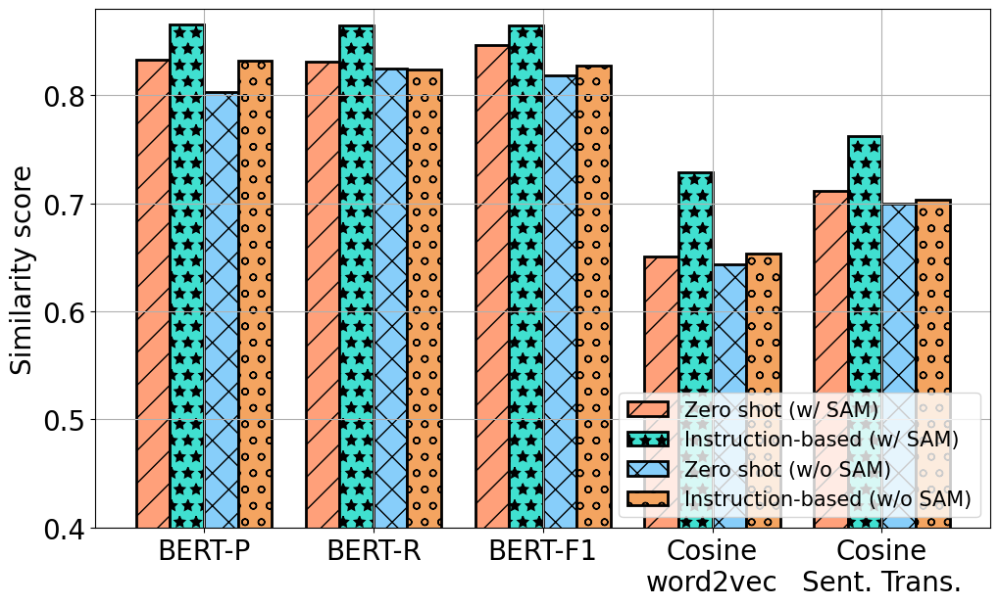

In [87]:

import matplotlib.pyplot as plt
import numpy as np
import matplotlib
matplotlib.rcParams.update({'font.size': 20})

# Data
grouped_bar_label = ['BERT-P', 'BERT-R', 'BERT-F1', 'Cosine\nword2vec', 'Cosine\nSent. Trans.']
zero_shot_with_sam_scores = np.array([0.8333, 0.8314, 0.8468, 0.6505, 0.7111])
instruction_with_sam_scores = np.array([0.8654, 0.8648, 0.8649, 0.7283, 0.7625])
zero_shot_no_sam_scores = np.array([0.8027, 0.8249, 0.8184, 0.6438, 0.6996])
instruction_no_sam_scores = np.array([0.8320, 0.8242, 0.8278, 0.6536, 0.7031])
legend_labels = ['Zero shot (w/ SAM)', 'Instruction-based (w/ SAM)', 'Zero shot (w/o SAM)', 'Instruction-based (w/o SAM)']

# Bar width
barWidth = 0.2

# Set position of bar on X axis
r1 = np.arange(len(grouped_bar_label))
r2 = [x + barWidth for x in r1]
r3 = [x + barWidth for x in r2]
r4 = [x + barWidth for x in r3]
patterns = ['/', '*', 'x', 'o']

# Make the plot
fig, ax = plt.subplots(figsize=(10, 6))
plt.bar(r1, zero_shot_with_sam_scores, color='lightsalmon',edgecolor='black',linewidth=2, width=barWidth, label=legend_labels[0], hatch=patterns[0])
plt.bar(r2, instruction_with_sam_scores, width=barWidth, color='turquoise',edgecolor='black',linewidth=2, label=legend_labels[1], hatch=patterns[1])
plt.bar(r3, zero_shot_no_sam_scores,width=barWidth, color='lightskyblue',edgecolor='black',linewidth=2, label=legend_labels[2], hatch=patterns[2])
plt.bar(r4, instruction_no_sam_scores, width=barWidth, color='sandybrown',edgecolor='black',linewidth=2, label=legend_labels[3], hatch=patterns[3])

# Add xticks on the middle of the group bars
plt.xticks([r + barWidth*1.5 for r in range(len(grouped_bar_label))], grouped_bar_label)

# Create legend & Show graphic
ax.set_ylabel('Similarity score')
ax.legend(fontsize="15", loc='lower right')

# Layout adjustments
plt.tight_layout(pad=0)
plt.grid()
plt.ylim(0.4, 0.88)

# Save plot as PDF
plt.savefig('score_visualization_new.pdf')

plt.show()
